## Refine Myeloid cell annotations for large intestine - relabelling uncertain cells based on manual inspection/majority voting

In [1]:
import scanpy as sc
import pandas as pd
import numpy as np
import sys
import os
from collections import Counter

import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import to_hex
import ast

In [2]:
sc.logging.print_header()

scanpy==1.8.0 anndata==0.8.0 umap==0.4.6 numpy==1.20.1 scipy==1.6.1 pandas==1.3.5 scikit-learn==0.24.1 statsmodels==0.13.5 python-igraph==0.8.3 louvain==0.7.0 leidenalg==0.8.3 pynndescent==0.5.2


In [3]:
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42

In [4]:
sc.set_figure_params(
    dpi=200,dpi_save=300,
    fontsize=12,
    frameon=False,
    transparent=True,
)

In [5]:
sns.set_style(style="white")
sns.set_context(context="paper")

### Import

In [6]:
#import data
adata = sc.read_h5ad('/nfs/team205/ao15/Megagut/Annotations_v3/h5ad/disease/compartments/Myeloid_pooled_disease.gene_cellbender.good_qc_cluster_mito80.stringent_doublet_removed.hvg7500_noCC.scvi_output.lv20_batch256.with_raw_counts.scArches_broad_pred.20230124.h5ad')

In [7]:
adata

AnnData object with n_obs × n_vars = 18221 × 36601
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH', 'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL', 'cecilia22_predL_prob', 'cecilia22_predL_uncertain', 'elmentaite21_pred', 'elmentaite21_pred_prob', 'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob', 'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_counts_hb_spl

In [8]:
#import scanvi coordinates
adata_scanvi = pd.read_csv('/nfs/team205/ao15/Megagut/Annotations_v3/metadata/X_scANVI/disease/disease_fine_annot_predict_Myeloid_20230226.csv.gz',compression='gzip',index_col=0)

In [9]:
adata_scanvi

,LV1,LV2,LV3,LV4,LV5,LV6,LV7,LV8,LV9,LV10,LV11,LV12,LV13,LV14,LV15,LV16,LV17,LV18,LV19,LV20
index,,,,,,,,,,,,,,,,,,,,
AACGTTGCACATCCGG-4918STDY7273964,-0.112569,-0.100826,0.074933,-0.161024,-0.951867,-2.406589,-0.072623,-0.974680,0.349273,0.124162,0.110668,0.127304,0.044043,0.000055,0.102898,-0.094656,0.161887,0.226361,-0.574102,0.213699
AACGTTGGTCTGGTCG-4918STDY7273964,-0.006792,0.456930,0.054259,-0.010730,1.459248,-0.117249,-0.029403,-0.102549,-0.676454,-0.063304,0.013695,0.584019,0.058644,0.116801,0.074464,-0.292093,0.377346,-0.617355,-0.389882,-0.741612
ACACCCTTCCACTGGG-4918STDY7273964,-0.062644,-0.210652,0.067213,-0.137204,-0.374680,-1.132450,-0.049296,-0.512336,0.842808,-0.028618,0.036911,0.980405,0.026192,-0.076069,0.112568,-0.005082,-0.838892,0.164022,0.788391,0.584406
ACCGTAATCCAGTAGT-4918STDY7273964,-0.059507,0.473951,0.084855,-0.131927,0.783788,-0.119713,-0.050485,-0.665735,0.736144,-0.038481,-0.019527,-2.572984,0.010009,-0.083272,0.004927,1.237161,0.138791,0.390739,0.052386,-0.040489
ACGGAGAAGGCCATAG-4918STDY7273964,-0.051205,-0.136943,0.037529,-0.120102,-0.849402,-0.513476,-0.021127,0.538718,1.106296,-0.077136,-0.008611,1.503432,0.018933,-0.119689,0.118129,0.591252,-0.898077,-0.072633,1.454538,0.519544
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTCTACACAAAGGTGC-GSM4546346,-0.067644,-0.302776,-0.038199,-0.058417,-1.211132,0.080967,0.011157,-1.700076,0.040767,-0.023786,-0.005778,0.772300,0.010234,0.004012,0.062601,1.545818,-0.841222,-0.770244,0.556329,0.330119
TTGCCGTCACCTCGGA-GSM4546346,-0.094833,-0.565015,0.006136,-0.071545,-0.156330,-0.980786,-0.017541,-2.259642,-2.244462,-0.125547,-0.000721,-0.866460,0.095269,-0.032431,-0.079334,0.979460,0.328843,-0.037268,1.219694,0.030011
TTGCCGTCATCCTTGC-GSM4546346,-0.107833,1.255753,0.126814,-0.154888,0.868575,-1.704775,-0.033831,0.015951,0.513549,-0.049415,0.022006,1.968374,-0.024999,-0.029609,0.185919,-1.069336,0.394183,0.371096,-0.942402,0.029239


In [10]:
adata.obsm['X_scANVI'] = adata_scanvi

In [11]:
#import metadata
adata_meta = pd.read_csv('/nfs/team205/ao15/Megagut/Annotations_v3/metadata/disease/20230308/scanvi/disease_fine_annot_predict_Myeloid_20230226.csv',index_col=0)

/home/jovyan/my-conda-envs/standard_plotting/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3437: DtypeWarning: Columns (84,100) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [12]:
adata_meta

,latent_cell_probability,latent_RT_efficiency,cecilia22_predH,cecilia22_predH_prob,cecilia22_predH_uncertain,cecilia22_predL,cecilia22_predL_prob,cecilia22_predL_uncertain,elmentaite21_pred,elmentaite21_pred_prob,...,martin19_pred_uncertain,warner20_pred,warner20_pred_prob,warner20_pred_uncertain,broad_predicted_labels,broad_predicted_labels_uncert,fine_annot,fine_predicted_labels,fine_predicted_labels_uncertainty,scanvi_pred
index,,,,,,,,,,,,,,,,,,,,,
AACGTTGCACATCCGG-4918STDY7273964,0.999860,1.762105,Macrophages,0.786272,Macrophages,DC2,0.976252,DC2,Monocytes,0.999998,...,LC,DC2,0.965123,DC2,Myeloid,0.000000e+00,Unknown,DC_cDC2,5.960464e-08,DC_cDC2
AACGTTGGTCTGGTCG-4918STDY7273964,0.999263,0.813128,Macrophages,0.169987,Uncertain,Erythrophagocytic macrophages,0.265324,Uncertain,cDC2,0.185741,...,rMac,Mac 1,0.298523,Uncertain,Myeloid,0.000000e+00,Unknown,Doublets,4.798167e-01,Doublets
ACACCCTTCCACTGGG-4918STDY7273964,0.999898,2.394783,Macrophages,0.996379,Macrophages,DC2,0.990095,DC2,Monocytes,0.998553,...,LC,DC2,0.972322,DC2,Myeloid,0.000000e+00,Unknown,DC_cDC2,4.800647e-01,DC_cDC2
ACCGTAATCCAGTAGT-4918STDY7273964,0.999764,1.324064,Mast cells,0.998680,Mast cells,Mast cells,0.999285,Mast cells,Mast cell,0.992964,...,Mast,Mast,0.526828,Mast,Myeloid,0.000000e+00,Unknown,Mast,0.000000e+00,Mast
ACGGAGAAGGCCATAG-4918STDY7273964,0.999833,2.045614,Macrophages,0.529783,Macrophages,DC2,0.308239,DC2,Monocytes,0.999969,...,Mono,DC2,0.980009,DC2,Myeloid,5.960464e-08,Unknown,Monocyte,1.200231e-01,Monocyte
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTCTACACAAAGGTGC-GSM4546346,0.999416,0.956914,Macrophages,0.901446,Macrophages,Intermediate macrophages,0.585687,Intermediate macrophages,Monocytes,0.984461,...,nrMac,DC2,0.559820,DC2,Myeloid,0.000000e+00,Unknown,Monocyte,0.000000e+00,Monocyte
TTGCCGTCACCTCGGA-GSM4546346,0.999773,1.198864,pDC,0.977038,pDC,pDC,0.965452,pDC,pDC,0.993473,...,pDC,DC2,0.252340,Uncertain,Myeloid,0.000000e+00,Unknown,DC_pDC,5.960464e-08,DC_pDC
TTGCCGTCATCCTTGC-GSM4546346,0.999798,1.324768,DC,0.261010,Uncertain,DC1,0.419731,DC1,cDC2,0.967643,...,LC,DC2,0.774193,DC2,Myeloid,0.000000e+00,Unknown,DC_cDC2,2.398816e-01,DC_migratory


In [13]:
adata.obs = adata_meta

### Process

In [14]:
#compute neighbours and umap
sc.pp.neighbors(adata, use_rep="X_scANVI")
sc.tl.umap(adata)

/home/jovyan/my-conda-envs/standard_plotting/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


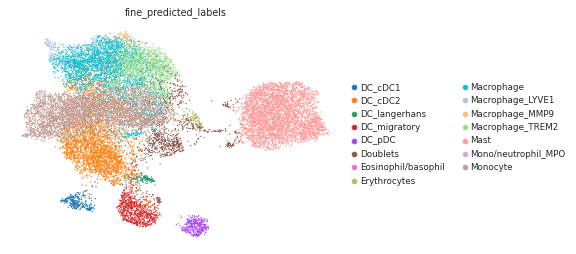

In [15]:
sc.pl.umap(adata, color=['fine_predicted_labels'])

In [16]:
adata.obs.donor_disease.unique()

['PIBD', 'cancer', 'UC', 'CD']
Categories (4, object): ['CD', 'PIBD', 'UC', 'cancer']

In [17]:
#fix metadata
adata.obs['disease'] = adata.obs['donor_category'].astype(str) + '_' + adata.obs['donor_disease'].astype(str)

In [18]:
list(adata.obs.disease.unique())

['disease_PIBD', 'disease_cancer', 'disease_UC', 'disease_CD']

In [19]:
adata.obs.disease.value_counts()

disease_cancer    11672
disease_PIBD       2841
disease_CD         2771
disease_UC          937
Name: disease, dtype: int64

In [20]:
adata.obs.donor_disease.unique()

['PIBD', 'cancer', 'UC', 'CD']
Categories (4, object): ['CD', 'PIBD', 'UC', 'cancer']

In [21]:
adata.obs['disease'] = (adata.obs['disease'].map(lambda x:{
'disease_cancer':'cancer',
    'disease_PIBD':'pediatric_IBD',
    'disease_UC':'ulcertaive_colitis',
    'disease_CD':'crohns_disease'
    }.get(x,x)).astype("category"))

In [22]:
cancer = adata[adata.obs['disease'].isin(['cancer'])].copy()

In [23]:
cancer.obs.disease.value_counts()

cancer    11672
Name: disease, dtype: int64

In [24]:
cancer.obs['disease'] = cancer.obs['disease'].astype(str) + '_' + cancer.obs['organ_unified'].astype(str)

In [25]:
cancer.obs.disease.value_counts()

cancer_stomach            8361
cancer_colon              1038
cancer_sigmoid colon       879
cancer_caecum              737
cancer_rectum              494
cancer_ascending colon     163
Name: disease, dtype: int64

In [26]:
cancer.obs['disease'] = (cancer.obs['disease'].map(lambda x:{'cancer_caecum':'cancer_colorectal',
 'cancer_rectum':'cancer_colorectal',
 'cancer_sigmoid colon':'cancer_colorectal',
 'cancer_colon':'cancer_colorectal',
 'cancer_ascending colon':'cancer_colorectal',
 'cancer_stomach':'cancer_gastric'}.get(x,x)).astype("category"))

In [27]:
cancer.obs.disease.value_counts()

cancer_gastric       8361
cancer_colorectal    3311
Name: disease, dtype: int64

In [28]:
ON = {O:N for O,N in zip(cancer.obs_names,cancer.obs["disease"])}
adata.obs["disease"] = [ON[O] if O in ON else N for O,N in zip(adata.obs_names, adata.obs["disease"])]
adata.obs.disease.value_counts()

cancer_gastric        8361
cancer_colorectal     3311
pediatric_IBD         2841
crohns_disease        2771
ulcertaive_colitis     937
Name: disease, dtype: int64

In [29]:
list(adata.obs.disease.unique())

['pediatric_IBD',
 'cancer_colorectal',
 'ulcertaive_colitis',
 'crohns_disease',
 'cancer_gastric']

In [30]:
adata.obs['disease'] = adata.obs['disease'].astype('category')

In [31]:
adata.obs['disease'] = (adata.obs['disease'].map(lambda x:{'ulcertaive_colitis':'ulcerative_colitis'}.get(x,x)).astype("category"))

In [32]:
adata.obs['disease'].cat.reorder_categories([
 'crohns_disease',
 'ulcerative_colitis',
 'pediatric_IBD',
 'cancer_colorectal',
 'cancer_gastric'], inplace=True)

<ipython-input-32-b0e974b68020>:1: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  adata.obs['disease'].cat.reorder_categories([


/home/jovyan/my-conda-envs/standard_plotting/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


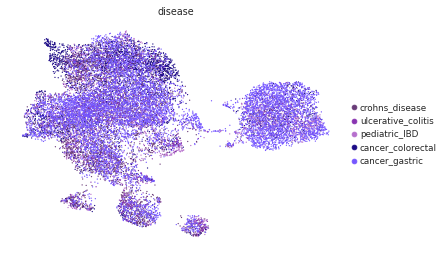

In [33]:
#plot umaps
sc.pl.umap(adata,color = 'disease',palette=[#'#ADD3DD',#control
                                    #'#ffb7b7',#'inutero',
                                     #'#f48154',#'preterm',
                                    '#693C78',#crohn's disease
                                            '#8934B1',#UC
                                            '#B670CD',#PIBD
                                            '#1C0B86',#colorectal cancer
                                            '#7657ff',#gastric cancer
                                           ])

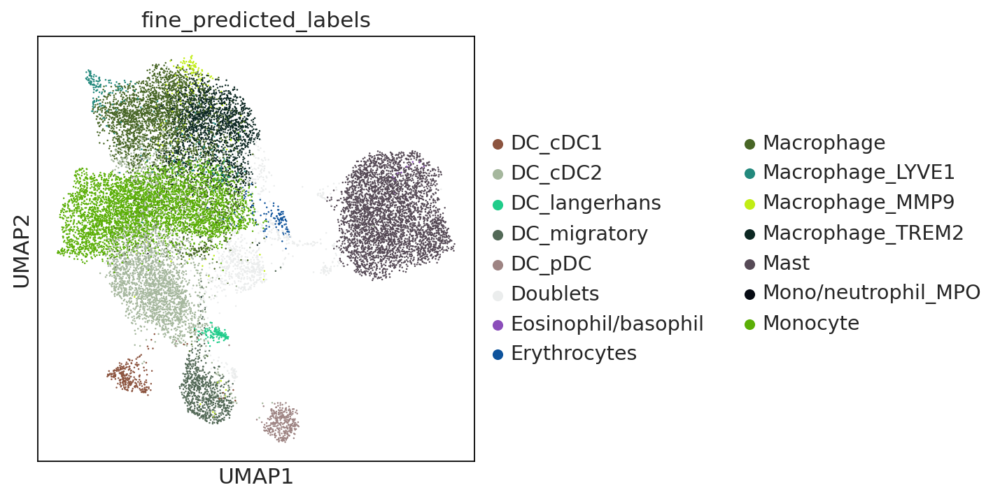

In [54]:
plt.rcParams['figure.figsize'] = [5,5]
sc.pl.umap(adata,color='fine_predicted_labels',palette = ['#8c543f',#DC_cDC1
'#a5b79d',#DC_cDC2
'#20cc8a',#DC_langerhans
'#536957',#DC_migratory
'#9e8483',#DC_pDC
 '#ebeded',#doublets
'#8b4eba',#Eosinophil/basophil
'#0e539c',#Erythrocytes
'#486626',#Macrophage
#'#caf9cf',#Macrophage_CD5L
'#23897d',#Macrophage_LYVE1
'#c1ed15',#Macrophage_MMP9
'#0d2823',#Macrophage_TREM2
'#564a56',#Mast
#'#c730aa',#Megakaryocyte/platelet
'#070c14',#Mono/neutrophil_MPO
'#5baf07']#Monocyte                                
           ,size=5)

In [38]:
adata.X.max()

11278.0

In [39]:
adata.layers['counts'] = adata.X

In [40]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

In [41]:
marker_genes_dict = {'cDC1':['CLEC9A','IDO1','XCR1'],
                    'cDC2':['FCER1A','CD1C','CLEC10A'],
                    'Langerhans cells':['ITGAX','IL22RA2','RUNX3'],
                    'Migratory DCs':['CCR7','LAMP3','CD83'],
                    'Plasmacytoid DCs':['IRF7','GZMB','JCHAIN','LILRA4'],
                    'Eosinophils/basophils':['CNRIP1','PRG2','GIHCG'],
                    'Erythrocytes':['HBZ','HBE1','HBG1'],
                    'Macrophage general markers':['C1QA','CD68','APOE','CD209'],
                    'Macrophage_CD5L':['CD5L','VCAM1','CXCL12','PDK4','RBP7'],
                    'Macrophage_LYVE1':['LYVE1','RNASE1','FOLR2'],
                    'Macrophage_MMP9':['MMP9','PLA2G2D','ADAMDEC1'],
                    'Macrophage_TREM2':['TREM2','ACP5','CTSD','CSTB'],
                    'Mast':['TPSB2','TPSAB1','CD69'],
                    'Megakaryocyte/platelet':['MMRN1','CMTM5','MPIG6B','ITGA2B','PF4'],
                    'Mono/neutrophil_MPO':['MPO','RETN','RNASE2','PCLAF'],
                    'Monocyte':['CD14','EREG','NAMPT','PLAUR','VCAN','FPR1']}

In [42]:
adata

AnnData object with n_obs × n_vars = 18221 × 36601
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH', 'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL', 'cecilia22_predL_prob', 'cecilia22_predL_uncertain', 'elmentaite21_pred', 'elmentaite21_pred_prob', 'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob', 'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_counts_hb_spl

/home/jovyan/my-conda-envs/standard_plotting/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


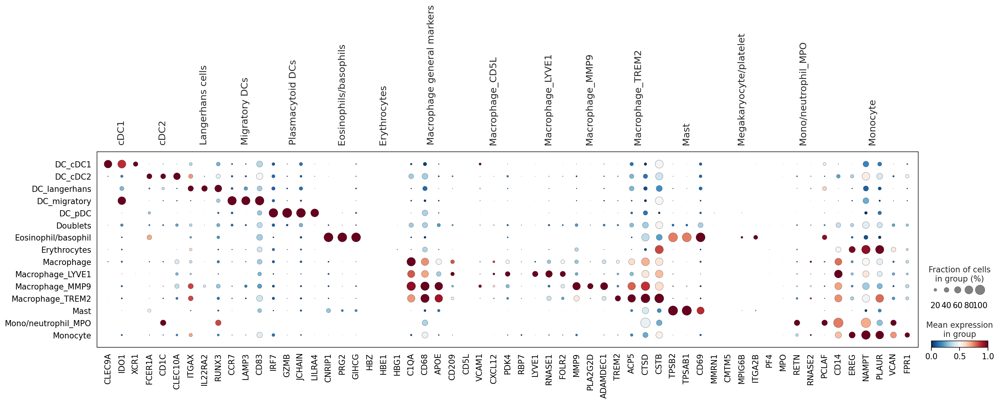

In [43]:
#plot markers
sc.set_figure_params(dpi_save = 300)
sc.pl.dotplot(adata,var_names=marker_genes_dict,groupby='fine_predicted_labels',color_map='RdBu_r', standard_scale='var')

### Define uncertain cells

In [44]:
uncert = adata.obs[['fine_predicted_labels','fine_predicted_labels_uncertainty']] 

In [45]:
#calculate 90th percentile to use as cut off for uncertain cells
p = np.percentile(adata.obs['fine_predicted_labels_uncertainty'], 90) # return 90th percentile
print(p)

0.5199918448925018


(array([6702.,  859.,  630., 1038.,  425.,  372.,  760.,  373.,  342.,
         653.,  372.,  330.,  322.,  662.,  354.,  359.,  670.,  318.,
         357.,  650.,  310.,  259.,  193.,  416.,  167.,  110.,  141.,
          39.,   21.,   17.]),
 array([0.        , 0.02600318, 0.05200636, 0.07800954, 0.10401272,
        0.13001589, 0.15601907, 0.18202225, 0.20802543, 0.23402861,
        0.26003179, 0.28603497, 0.31203815, 0.33804133, 0.36404451,
        0.39004768, 0.41605086, 0.44205404, 0.46805722, 0.4940604 ,
        0.52006358, 0.54606676, 0.57206994, 0.59807312, 0.62407629,
        0.65007947, 0.67608265, 0.70208583, 0.72808901, 0.75409219,
        0.78009537]),
 <BarContainer object of 30 artists>)

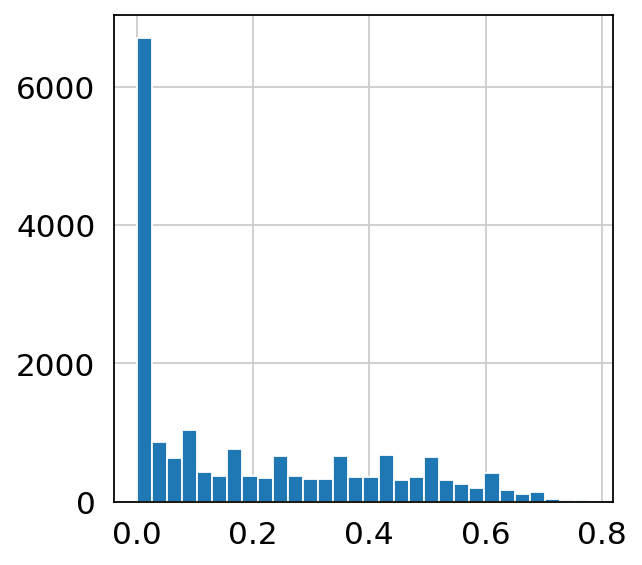

In [46]:
#plot uncertainty distribution
plt.hist(adata.obs['fine_predicted_labels_uncertainty'], bins=30)

In [47]:
uncert['fine_predicted_labels'] = uncert['fine_predicted_labels'].cat.add_categories('Unknown')

<ipython-input-47-905f2ed234d6>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  uncert['fine_predicted_labels'] = uncert['fine_predicted_labels'].cat.add_categories('Unknown')


In [48]:
adata.obs['fine_predicted_labels'].unique()

['DC_cDC2', 'Doublets', 'Mast', 'Monocyte', 'Macrophage_MMP9', ..., 'Erythrocytes', 'Mono/neutrophil_MPO', 'DC_langerhans', 'Macrophage_LYVE1', 'Eosinophil/basophil']
Length: 15
Categories (15, object): ['DC_cDC1', 'DC_cDC2', 'DC_langerhans', 'DC_migratory', ..., 'Macrophage_TREM2', 'Mast', 'Mono/neutrophil_MPO', 'Monocyte']

In [49]:
#mark cells are unknown based on cut off of 90th percentile
uncert.loc[uncert["fine_predicted_labels_uncertainty"] > p, "fine_predicted_labels"] = "Unknown"

/home/jovyan/my-conda-envs/standard_plotting/lib/python3.8/site-packages/pandas/core/indexing.py:1817: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)


In [50]:
adata.obs['fine_predicted_labels_uncertflagged'] = adata.obs['fine_predicted_labels']

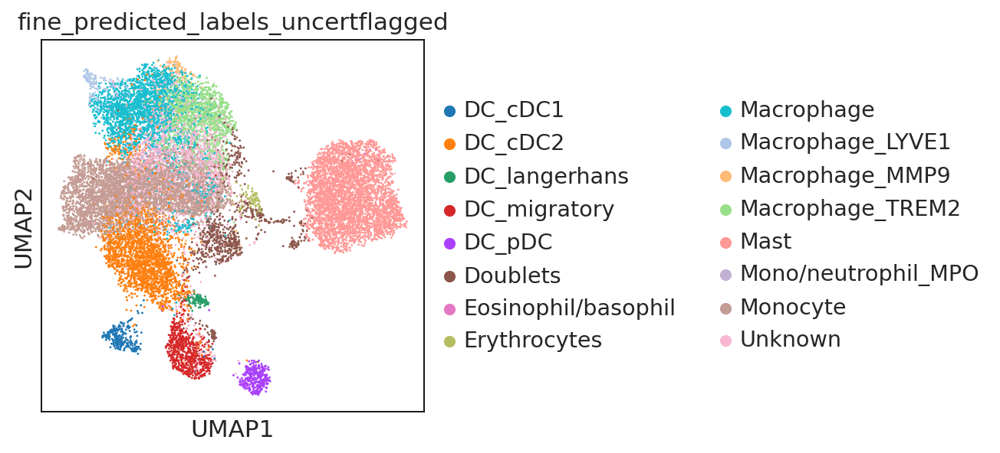

In [51]:
ON = {O:N for O,N in zip(uncert.index,uncert["fine_predicted_labels"])}
adata.obs["fine_predicted_labels_uncertflagged"] = [ON[O] if O in ON else N for O,N in zip(adata.obs_names, adata.obs["fine_predicted_labels_uncertflagged"])]
sc.pl.umap(adata,color='fine_predicted_labels_uncertflagged')

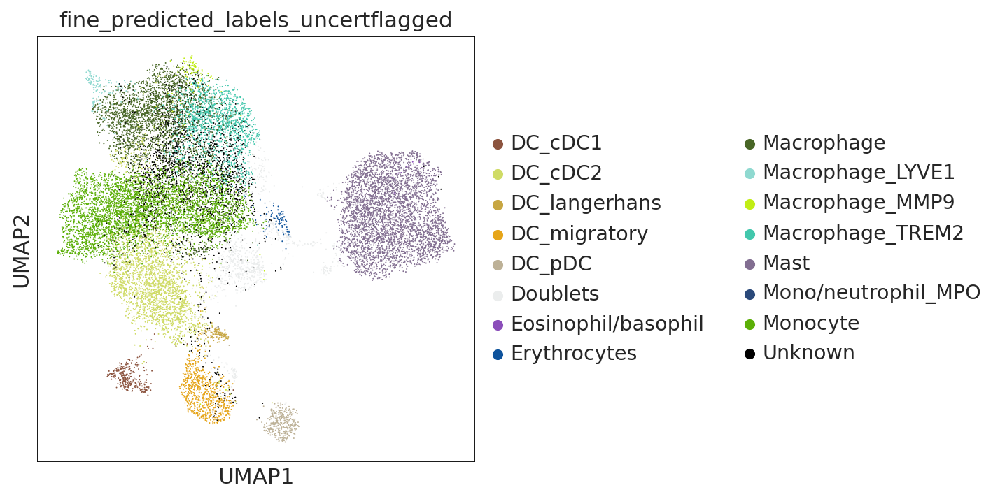

In [63]:
plt.rcParams['figure.figsize'] = [5,5]
sc.pl.umap(adata,color='fine_predicted_labels_uncertflagged',palette = ['#8c543f',#DC_cDC1
'#cfdb65',#DC_cDC2
'#c7a642',#DC_langerhans
'#e6a519',#DC_migratory
'#bdb197',#DC_pDC
 '#ebeded',#doublets
'#8b4eba',#Eosinophil/basophil
'#0e539c',#Erythrocytes
'#486626',#Macrophage
#'#caf9cf',#Macrophage_CD5L
'#8fd9d0',#Macrophage_LYVE1
'#c1ed15',#Macrophage_MMP9
'#42c7ac',#Macrophage_TREM2
'#826e91',#Mast
#'#c730aa',#Megakaryocyte/platelet
'#2a497a',#Mono/neutrophil_MPO
'#5baf07',#Monocyte 
'#000000'#unknown
                                                                       ],size=3)

### Finalise annotations
- calculate leiden clusters
- inspect annotations across leiden clusters
- assess marker genes, doublet markers, donor distribution
- relabel based on majority voting of leiden clusters, along with confirmation from marker genes etc.

In [64]:
#reassign labels for unknown cells by leiden clustering and majority voting
sc.tl.leiden(adata,resolution=1,key_added='leiden1')

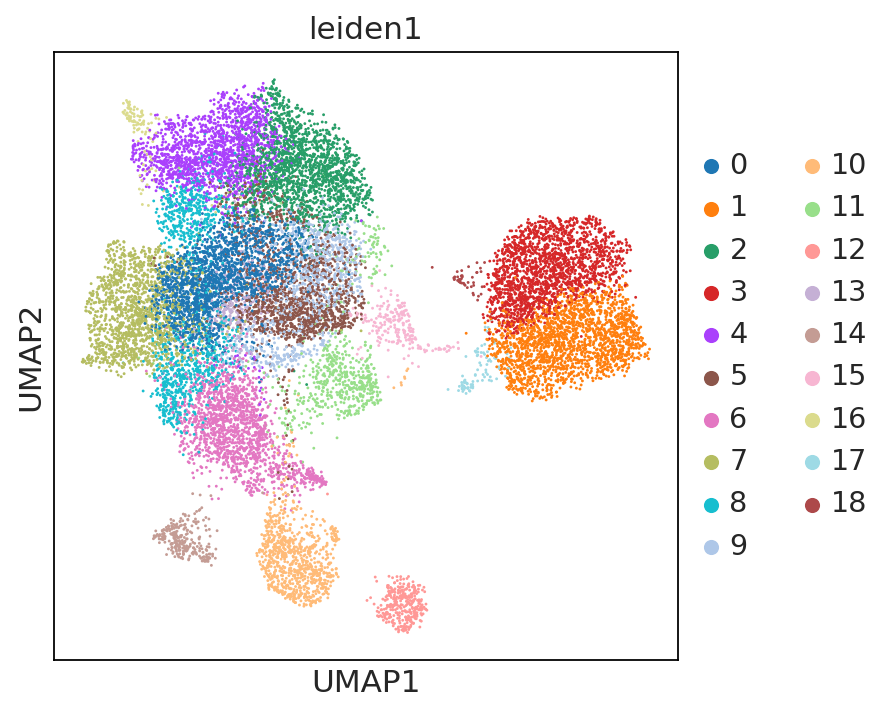

In [65]:
sc.pl.umap(adata,color='leiden1')

In [68]:
#quick look at leiden resolution 0.5
sc.tl.leiden(adata,resolution=0.5,key_added='leiden0.5')

/home/jovyan/my-conda-envs/standard_plotting/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


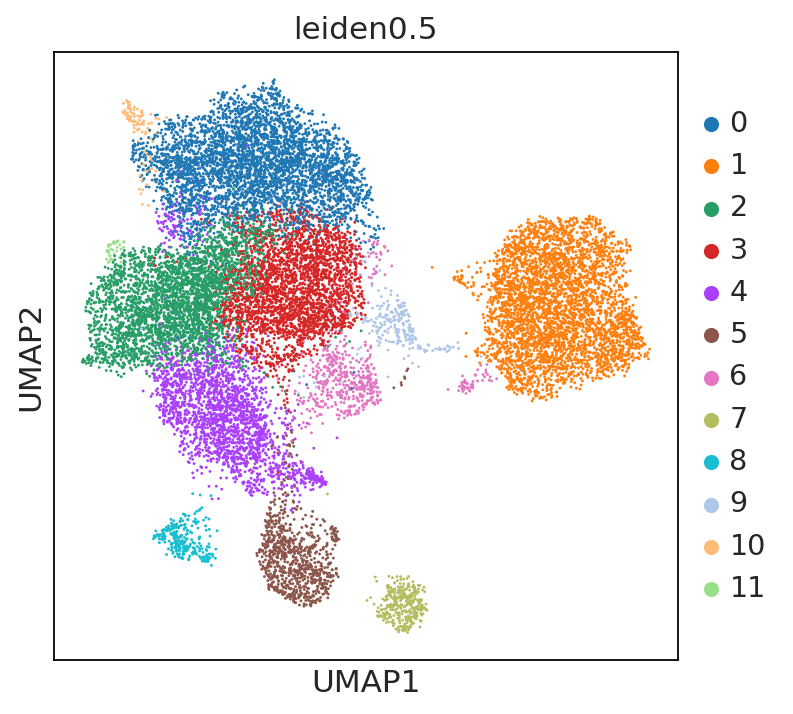

In [69]:
sc.pl.umap(adata,color='leiden0.5')

In [66]:
pd.crosstab(adata.obs.leiden1,adata.obs.fine_predicted_labels_uncertflagged)

fine_predicted_labels_uncertflagged,DC_cDC1,DC_cDC2,DC_langerhans,DC_migratory,DC_pDC,Doublets,Eosinophil/basophil,Erythrocytes,Macrophage,Macrophage_LYVE1,Macrophage_MMP9,Macrophage_TREM2,Mast,Mono/neutrophil_MPO,Monocyte,Unknown
leiden1,,,,,,,,,,,,,,,,
0,0,156,0,0,0,3,0,0,17,3,0,69,0,1,1321,430
1,0,0,0,0,0,1,1,0,0,0,0,0,1858,0,0,1
2,0,1,0,0,0,23,0,0,248,7,98,1093,0,0,12,321
3,0,0,0,0,0,3,13,0,0,0,0,0,1736,0,0,5
4,0,29,0,0,0,1,0,0,1365,62,10,51,0,0,0,109
5,0,36,0,8,0,2,0,3,290,1,0,61,0,0,911,175
6,5,1315,109,0,2,7,0,0,1,0,0,0,0,0,19,27
7,0,18,0,0,0,4,0,0,2,1,0,0,0,0,1408,13
8,0,657,0,0,0,1,0,0,305,0,6,2,0,0,39,108


In [71]:
pd.crosstab(adata.obs['leiden0.5'],adata.obs.fine_predicted_labels_uncertflagged)

fine_predicted_labels_uncertflagged,DC_cDC1,DC_cDC2,DC_langerhans,DC_migratory,DC_pDC,Doublets,Eosinophil/basophil,Erythrocytes,Macrophage,Macrophage_LYVE1,Macrophage_MMP9,Macrophage_TREM2,Mast,Mono/neutrophil_MPO,Monocyte,Unknown
leiden0.5,,,,,,,,,,,,,,,,
0,0,77,0,0,0,57,0,0,1967,74,112,1138,0,0,7,510
1,0,0,0,0,0,44,14,0,0,0,0,0,3631,0,0,6
2,0,219,0,0,0,6,0,0,20,5,1,27,0,1,2529,406
3,0,119,0,2,0,24,0,12,344,14,0,167,0,0,1477,693
4,5,1886,109,0,2,14,0,0,57,0,1,2,0,0,22,65
5,4,28,0,683,0,54,0,0,1,0,4,0,0,0,0,73
6,0,6,1,0,0,494,0,0,3,0,3,3,7,0,4,27
7,0,1,0,0,318,2,0,0,0,0,0,0,0,0,0,2
8,261,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [72]:
#Use Leiden resolution 1
unknown = adata.obs[['leiden1','fine_predicted_labels_uncertflagged']]

In [73]:
unknown = unknown[unknown['fine_predicted_labels_uncertflagged'].isin(['Unknown'])]

In [74]:
unknown

,leiden1,fine_predicted_labels_uncertflagged
index,,
AGCTCTCTCACAGGCC-4918STDY7273964,4,Unknown
GATCGTACACGTCAGC-4918STDY7273964,13,Unknown
GCATGCGCATCGGAAG-4918STDY7273964,2,Unknown
GTGCGGTGTCGCGAAA-4918STDY7273964,9,Unknown
TACAGTGTCGGGAGTA-4918STDY7273964,5,Unknown
...,...,...
GCATGATTCTTGTACT-GSM4546346,2,Unknown
TACGGTAAGAATTCCC-GSM4546346,9,Unknown
TCTCATACACATCCGG-GSM4546346,15,Unknown


/home/jovyan/my-conda-envs/standard_plotting/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


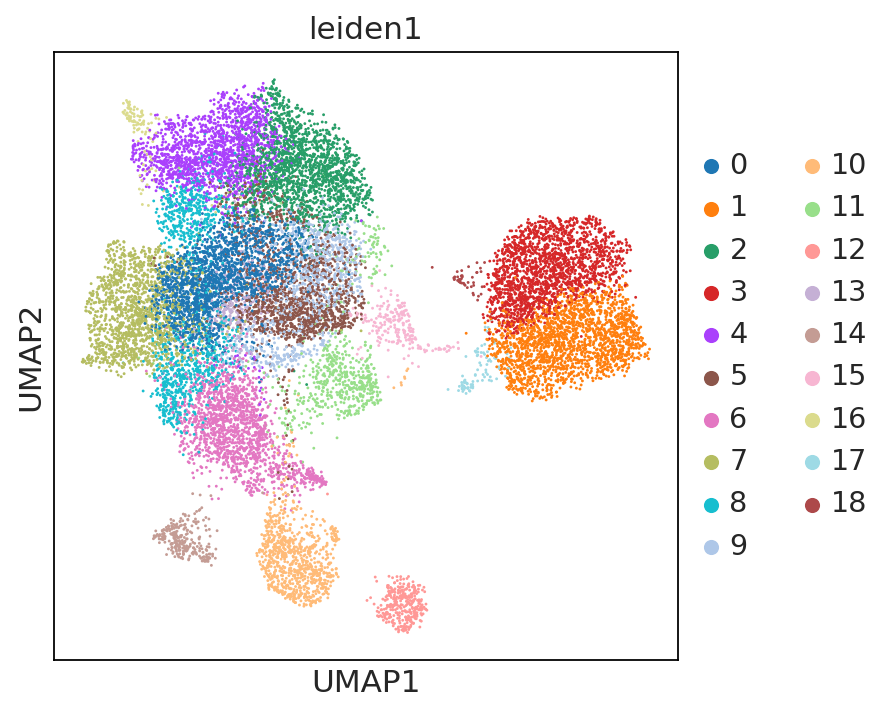

In [75]:
sc.pl.umap(adata,color='leiden1')

/home/jovyan/my-conda-envs/standard_plotting/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


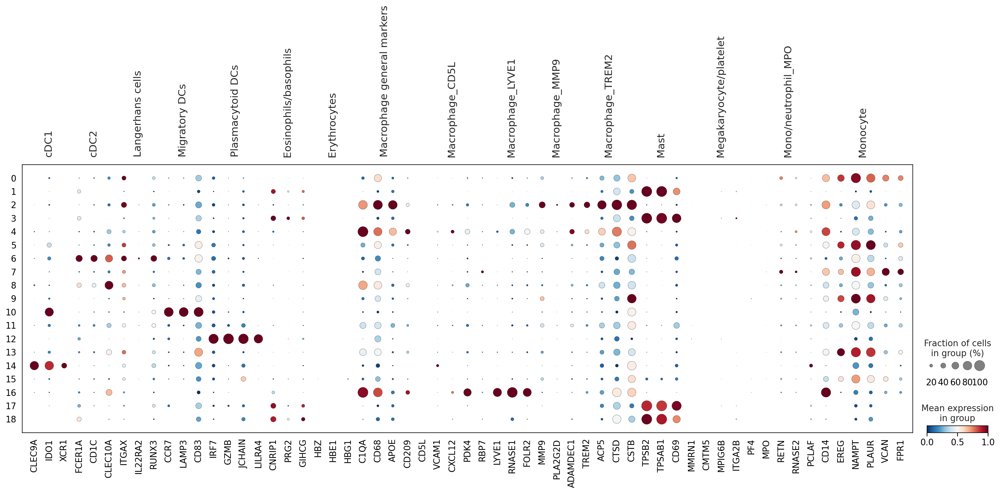

In [76]:
sc.pl.dotplot(adata,var_names=marker_genes_dict,groupby='leiden1',color_map='RdBu_r', standard_scale='var')

In [77]:
pd.crosstab(adata.obs.leiden1,adata.obs.fine_predicted_labels_uncertflagged)

fine_predicted_labels_uncertflagged,DC_cDC1,DC_cDC2,DC_langerhans,DC_migratory,DC_pDC,Doublets,Eosinophil/basophil,Erythrocytes,Macrophage,Macrophage_LYVE1,Macrophage_MMP9,Macrophage_TREM2,Mast,Mono/neutrophil_MPO,Monocyte,Unknown
leiden1,,,,,,,,,,,,,,,,
0,0,156,0,0,0,3,0,0,17,3,0,69,0,1,1321,430
1,0,0,0,0,0,1,1,0,0,0,0,0,1858,0,0,1
2,0,1,0,0,0,23,0,0,248,7,98,1093,0,0,12,321
3,0,0,0,0,0,3,13,0,0,0,0,0,1736,0,0,5
4,0,29,0,0,0,1,0,0,1365,62,10,51,0,0,0,109
5,0,36,0,8,0,2,0,3,290,1,0,61,0,0,911,175
6,5,1315,109,0,2,7,0,0,1,0,0,0,0,0,19,27
7,0,18,0,0,0,4,0,0,2,1,0,0,0,0,1408,13
8,0,657,0,0,0,1,0,0,305,0,6,2,0,0,39,108


In [78]:
unknown_adata = adata[adata.obs['fine_predicted_labels_uncertflagged'].isin(['Unknown'])].copy()

/home/jovyan/my-conda-envs/standard_plotting/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


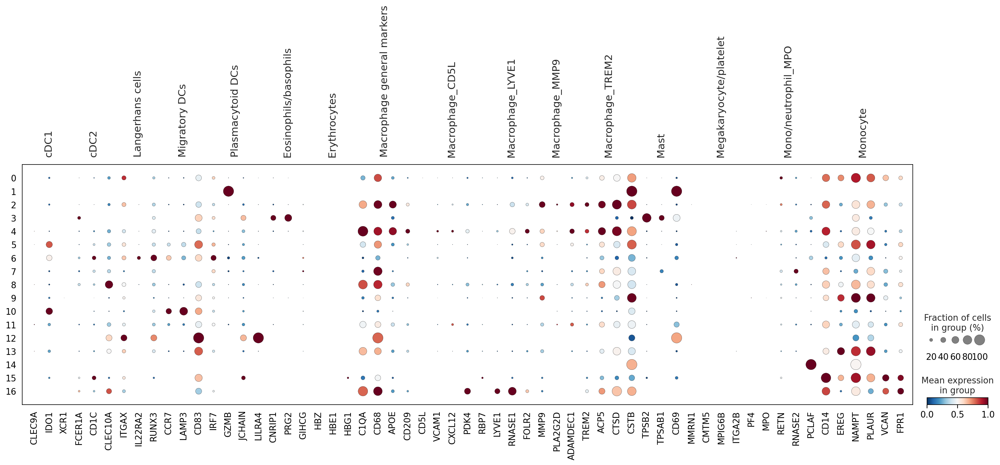

In [79]:
sc.pl.dotplot(unknown_adata,var_names=marker_genes_dict,groupby='leiden1',color_map='RdBu_r', standard_scale='var')

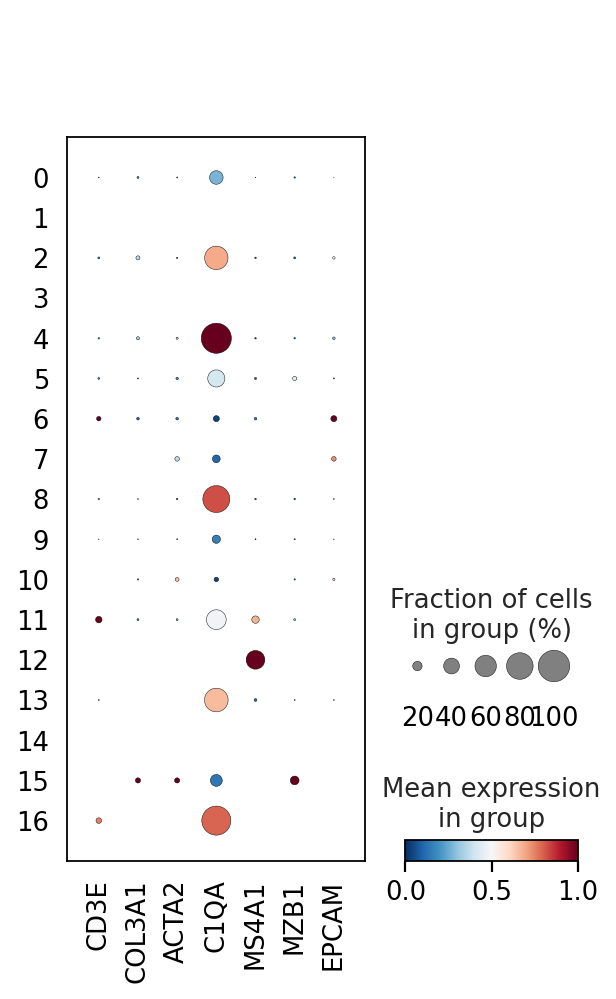

In [90]:
#plot some doublet markers
sc.pl.dotplot(unknown_adata,var_names=['CD3E','COL3A1','ACTA2','C1QA','MS4A1','MZB1','EPCAM'],groupby='leiden1',color_map='RdBu_r', standard_scale='var')

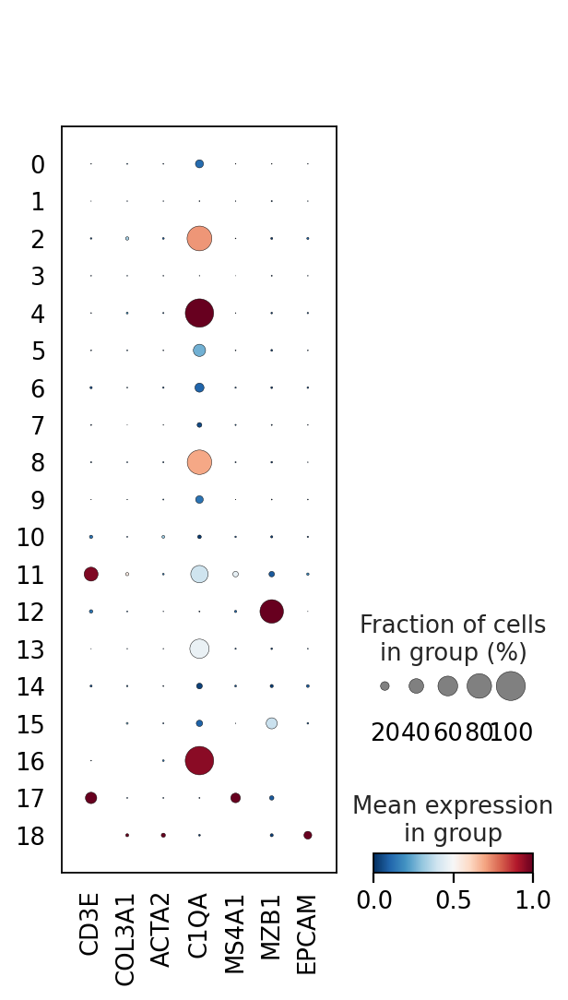

In [91]:
#plot some doublet markers
sc.pl.dotplot(adata,var_names=['CD3E','COL3A1','ACTA2','C1QA','MS4A1','MZB1','EPCAM'],groupby='leiden1',color_map='RdBu_r', standard_scale='var')

/home/jovyan/my-conda-envs/standard_plotting/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


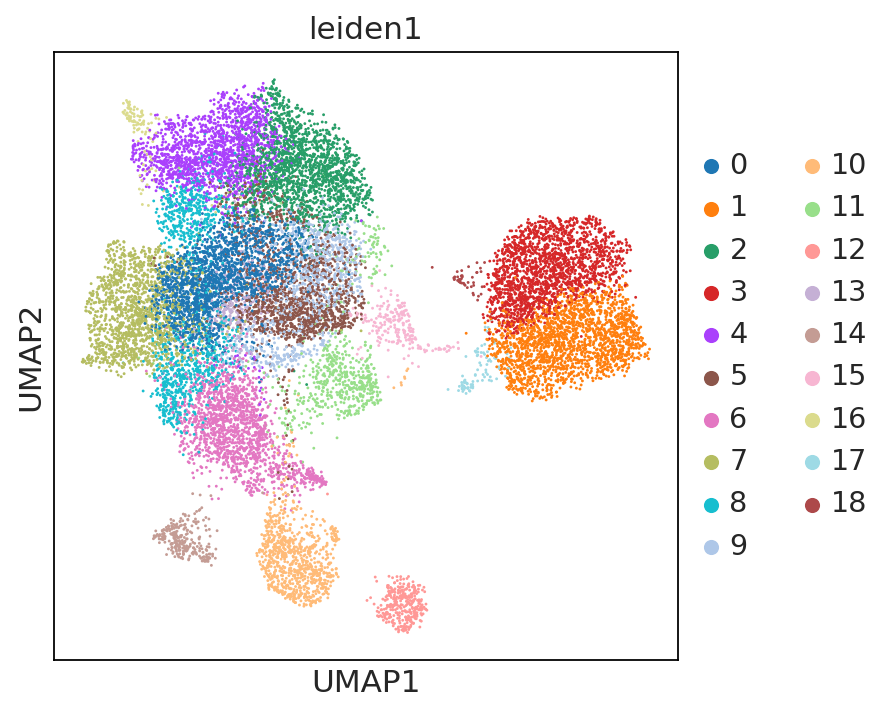

In [82]:
sc.pl.umap(adata,color='leiden1')

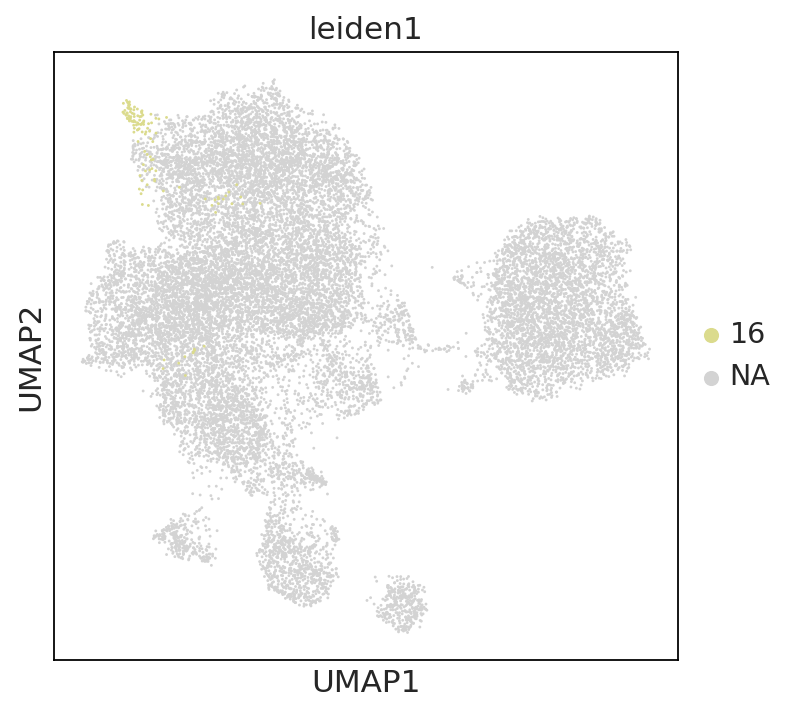

In [97]:
sc.pl.umap(adata,color='leiden1',groups='16')

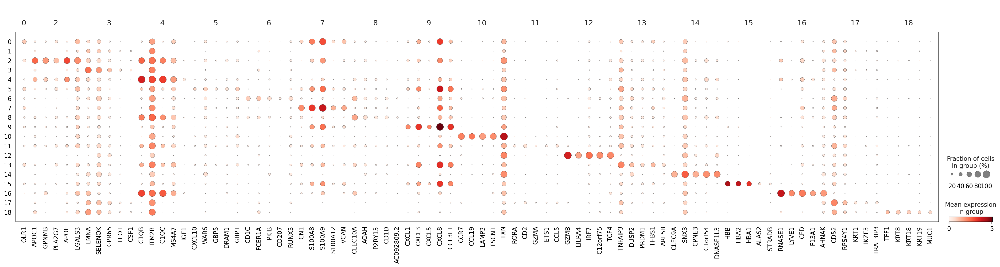

In [83]:
import sys
sys.path.append("/home/jovyan/ao15/Megagut/")
from re5_combine import *
adata.raw = adata.copy()
mkst = calc_marker_stats(adata, groupby="leiden1")
mks = filter_marker_stats(mkst[2], min_frac_diff=0.1, min_mean_diff=0.1, max_next_frac=0.5, max_next_mean=0.95, strict=False, how='or')
plot_markers(adata, groupby='leiden1', mks=mks)

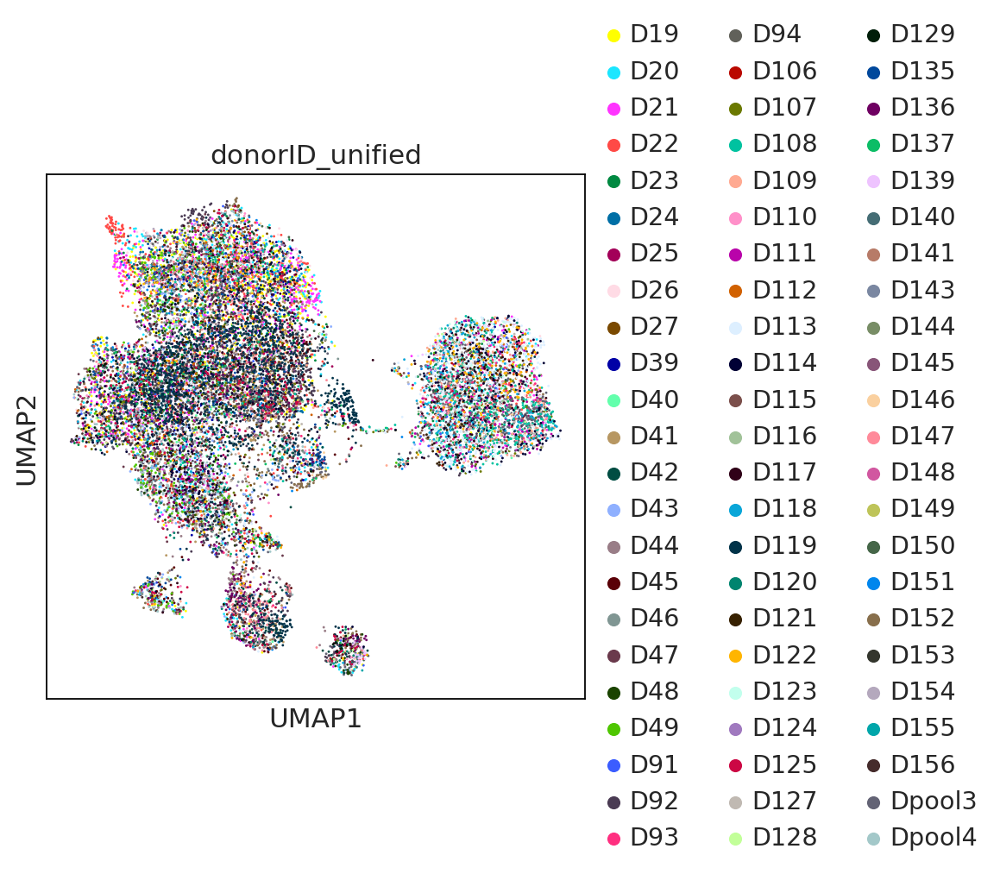

In [84]:
sc.pl.umap(adata,color='donorID_unified')

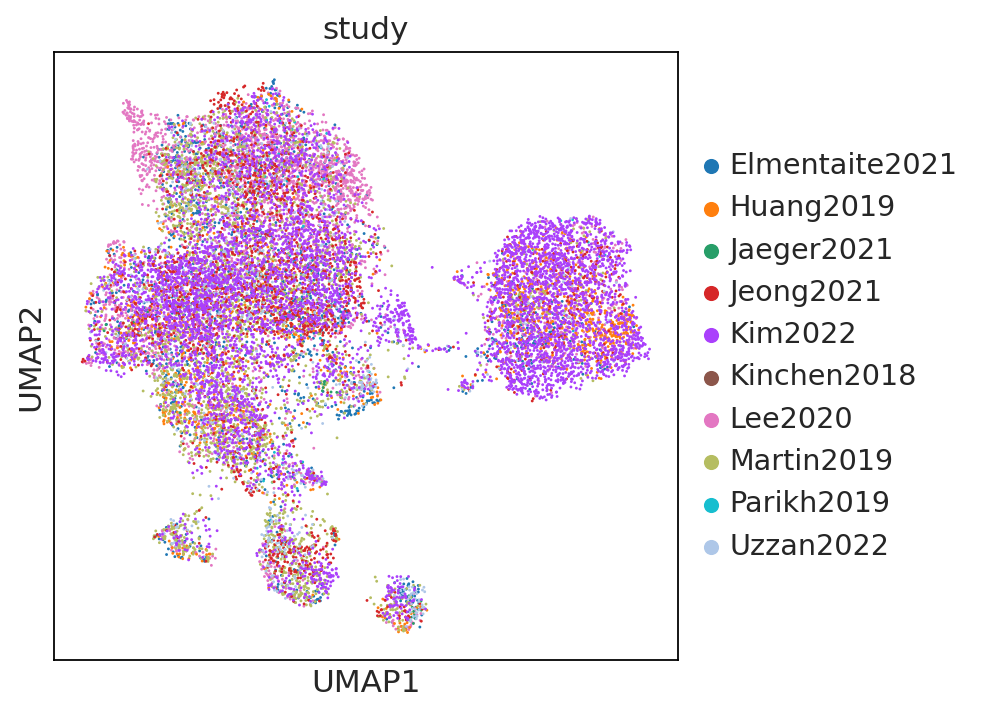

In [85]:
sc.pl.umap(adata,color='study')

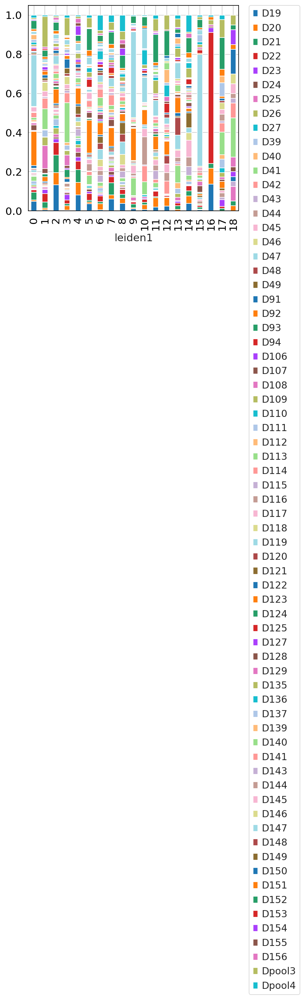

In [86]:
tmp = pd.crosstab(adata.obs['leiden1'], adata.obs['donorID_unified'],normalize='index'
                                                                         )
tmp.plot.bar(stacked=True).legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

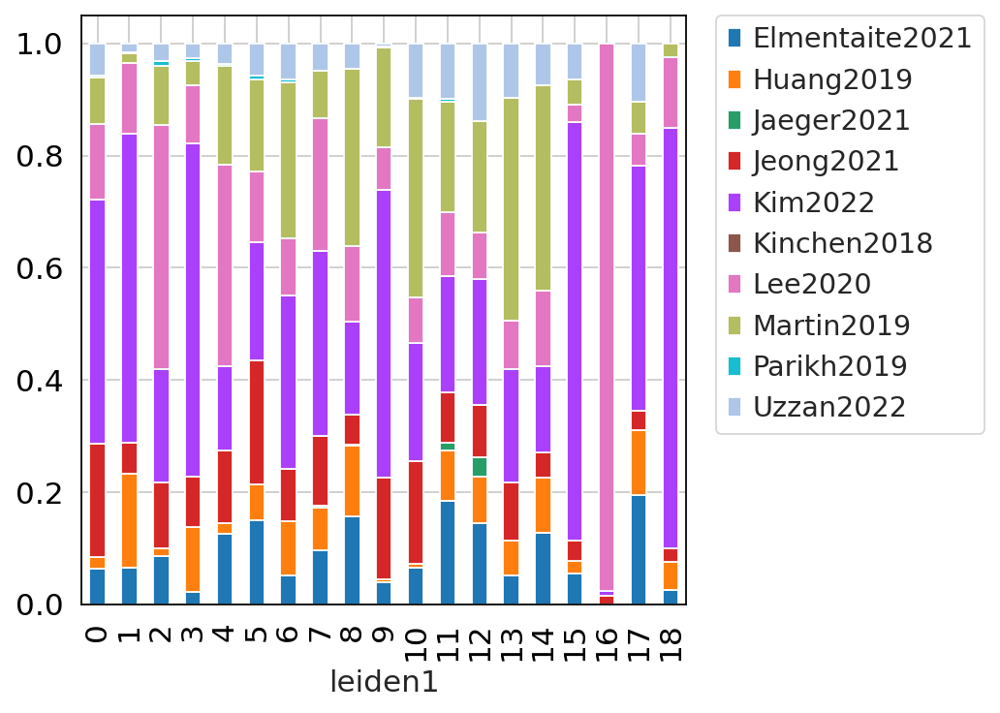

In [96]:
tmp = pd.crosstab(adata.obs['leiden1'], adata.obs['study'],normalize='index'
                                                                         )
tmp.plot.bar(stacked=True).legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

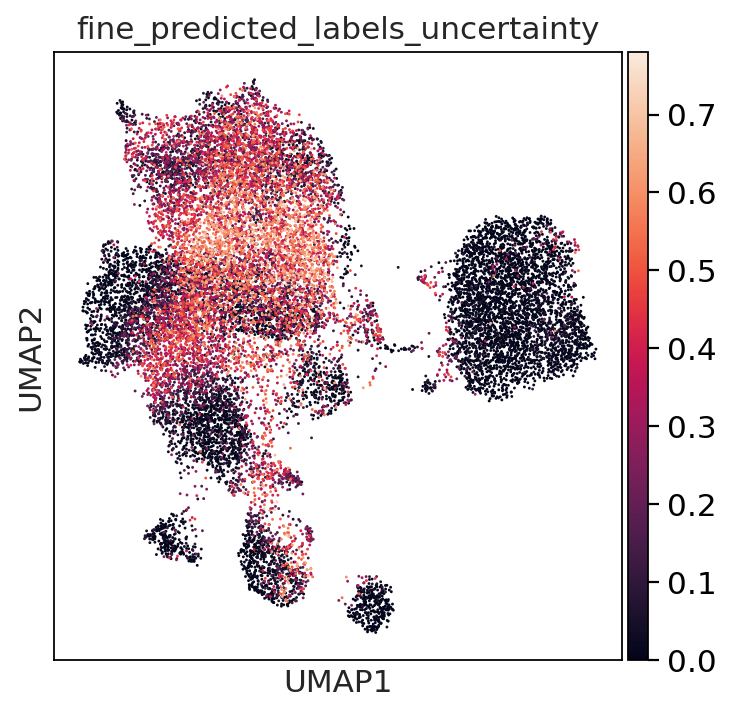

In [87]:
sc.pl.umap(adata,color='fine_predicted_labels_uncertainty')

In [93]:
pd.crosstab(adata.obs.leiden1,adata.obs.disease)

disease,crohns_disease,ulcerative_colitis,pediatric_IBD,cancer_colorectal,cancer_gastric
leiden1,,,,,
0,165,122,169,271,1273
1,34,31,433,234,1129
2,190,72,179,784,578
3,77,55,244,181,1200
4,288,65,235,584,455
5,244,97,319,187,640
6,414,105,220,149,597
7,125,71,250,343,657
8,354,51,317,151,245


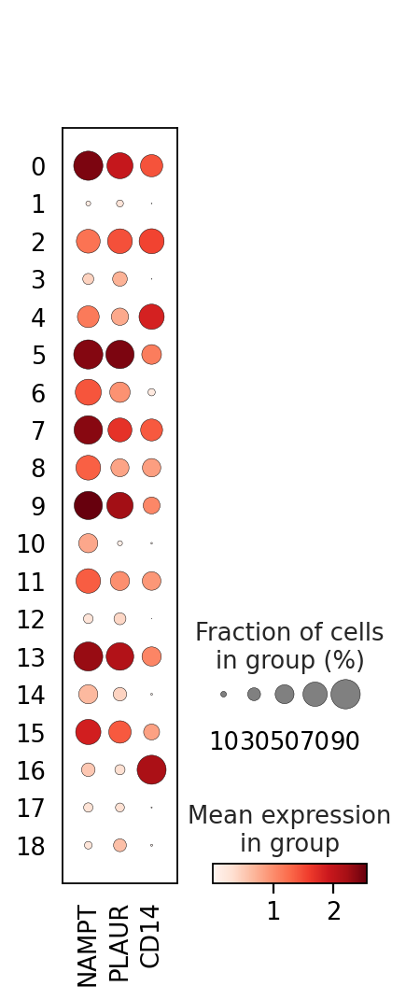

In [95]:
sc.pl.dotplot(adata,var_names=['NAMPT','PLAUR','CD14'],groupby='leiden1')

In [88]:
pd.crosstab(adata.obs.leiden1,adata.obs.fine_predicted_labels_uncertflagged)

fine_predicted_labels_uncertflagged,DC_cDC1,DC_cDC2,DC_langerhans,DC_migratory,DC_pDC,Doublets,Eosinophil/basophil,Erythrocytes,Macrophage,Macrophage_LYVE1,Macrophage_MMP9,Macrophage_TREM2,Mast,Mono/neutrophil_MPO,Monocyte,Unknown
leiden1,,,,,,,,,,,,,,,,
0,0,156,0,0,0,3,0,0,17,3,0,69,0,1,1321,430
1,0,0,0,0,0,1,1,0,0,0,0,0,1858,0,0,1
2,0,1,0,0,0,23,0,0,248,7,98,1093,0,0,12,321
3,0,0,0,0,0,3,13,0,0,0,0,0,1736,0,0,5
4,0,29,0,0,0,1,0,0,1365,62,10,51,0,0,0,109
5,0,36,0,8,0,2,0,3,290,1,0,61,0,0,911,175
6,5,1315,109,0,2,7,0,0,1,0,0,0,0,0,19,27
7,0,18,0,0,0,4,0,0,2,1,0,0,0,0,1408,13
8,0,657,0,0,0,1,0,0,305,0,6,2,0,0,39,108


In [98]:
unknown['fine_predicted_labels_resolved'] = (unknown['leiden1']
        .map(lambda x:{'0':'Monocyte',
                       '1':'Mast',
                       '2':'Macrophage_TREM2',
                       '3':'Mast', 
                       '4':'Macrophage',
                       '5':'Monocyte', 
                       '6':'DC_cDC2',
                       '7':'Monocyte',
                       '8':'DC_cDC2', 
                       '9':'Monocyte',
                       '10':'DC_migratory',
                       '11':'Doublets', 
                       '12':'DC_pDC', 
                       '13':'Monocyte',
                       '14':'DC_cDC1',
                       '15':'Doublets',
                       '16':'Macrophage_LYVE1',
                         }.get(x,x)).astype('category'))

In [99]:
unknown

,leiden1,fine_predicted_labels_uncertflagged,fine_predicted_labels_resolved
index,,,
AGCTCTCTCACAGGCC-4918STDY7273964,4,Unknown,Macrophage
GATCGTACACGTCAGC-4918STDY7273964,13,Unknown,Monocyte
GCATGCGCATCGGAAG-4918STDY7273964,2,Unknown,Macrophage_TREM2
GTGCGGTGTCGCGAAA-4918STDY7273964,9,Unknown,Monocyte
TACAGTGTCGGGAGTA-4918STDY7273964,5,Unknown,Monocyte
...,...,...,...
GCATGATTCTTGTACT-GSM4546346,2,Unknown,Macrophage_TREM2
TACGGTAAGAATTCCC-GSM4546346,9,Unknown,Monocyte
TCTCATACACATCCGG-GSM4546346,15,Unknown,Doublets


In [100]:
adata

AnnData object with n_obs × n_vars = 18221 × 36601
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH', 'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL', 'cecilia22_predL_prob', 'cecilia22_predL_uncertain', 'elmentaite21_pred', 'elmentaite21_pred_prob', 'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob', 'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_counts_hb_spl

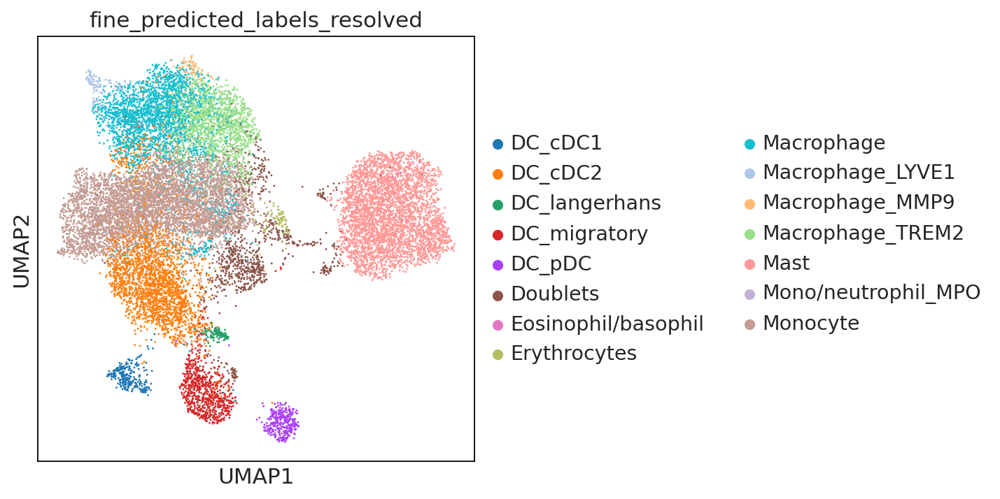

In [101]:
ON = {O:N for O,N in zip(unknown.index,unknown["fine_predicted_labels_resolved"])}
adata.obs["fine_predicted_labels_resolved"] = [ON[O] if O in ON else N for O,N in zip(adata.obs_names, adata.obs["fine_predicted_labels_uncertflagged"])]
sc.pl.umap(adata,color='fine_predicted_labels_resolved')

In [102]:
no_doublets = adata[~adata.obs.fine_predicted_labels_resolved.isin(['Doublets'])].copy()

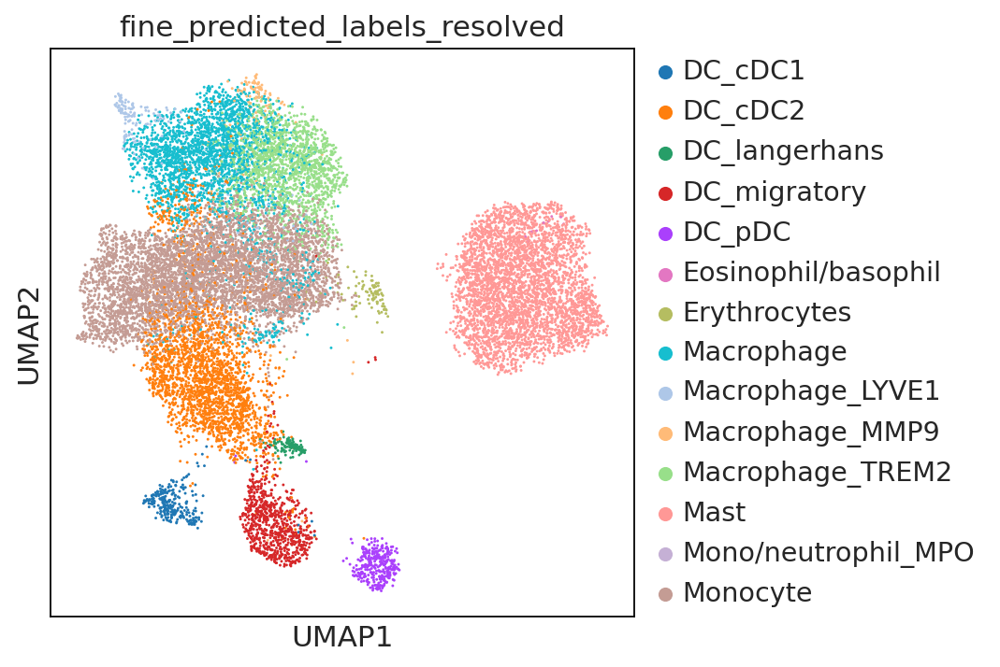

In [103]:
sc.pl.umap(no_doublets,color='fine_predicted_labels_resolved')

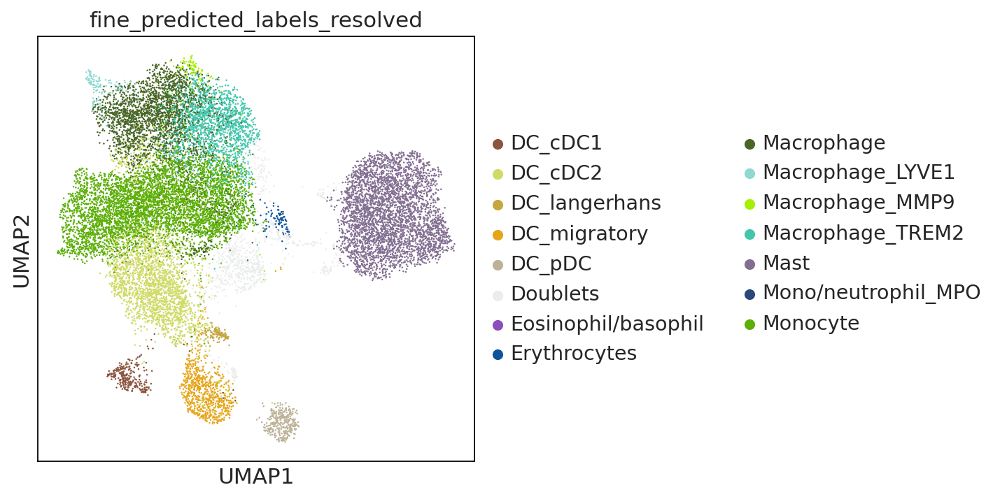

In [106]:
plt.rcParams['figure.figsize'] = [5,5]
sc.pl.umap(adata,color='fine_predicted_labels_resolved',palette = ['#8c543f',#DC_cDC1
'#cfdb65',#DC_cDC2
'#c7a642',#DC_langerhans
'#e6a519',#DC_migratory
'#bdb197',#DC_pDC
 '#ebeded',#doublets
'#8b4eba',#Eosinophil/basophil
'#0e539c',#Erythrocytes
'#486626',#Macrophage
#'#caf9cf',#Macrophage_CD5L
'#8fd9d0',#Macrophage_LYVE1
'#a5f002',#Macrophage_MMP9
'#42c7ac',#Macrophage_TREM2
'#826e91',#Mast
#'#c730aa',#Megakaryocyte/platelet
'#2a497a',#Mono/neutrophil_MPO
'#5baf07',#Monocyte 
    
                                              ],size=5)

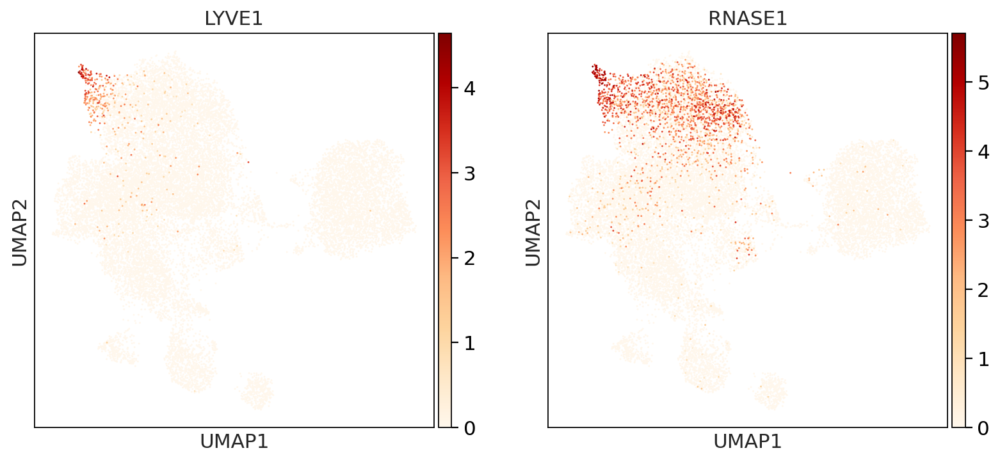

In [107]:
sc.pl.umap(adata,color=['LYVE1','RNASE1'],cmap='OrRd')

In [108]:
annot = adata.obs[['fine_predicted_labels_uncertflagged','fine_predicted_labels_resolved']]

In [109]:
annot

,fine_predicted_labels_uncertflagged,fine_predicted_labels_resolved
index,,
AACGTTGCACATCCGG-4918STDY7273964,DC_cDC2,DC_cDC2
AACGTTGGTCTGGTCG-4918STDY7273964,Doublets,Doublets
ACACCCTTCCACTGGG-4918STDY7273964,DC_cDC2,DC_cDC2
ACCGTAATCCAGTAGT-4918STDY7273964,Mast,Mast
ACGGAGAAGGCCATAG-4918STDY7273964,Monocyte,Monocyte
...,...,...
TTCTACACAAAGGTGC-GSM4546346,Monocyte,Monocyte
TTGCCGTCACCTCGGA-GSM4546346,DC_pDC,DC_pDC
TTGCCGTCATCCTTGC-GSM4546346,DC_cDC2,DC_cDC2


In [110]:
#export final annotations
annot.to_csv('/nfs/team205/ao15/Megagut/Annotations_v3/disease_annot/resolved_annot/Myeloid_disease_annot.csv')